In [1]:
from bin import load_bgi as ld
from scipy.stats import pearsonr
from pytorch_msssim import ssim, ms_ssim
from tqdm import tqdm

import scanpy as sc
import squidpy as sq
import numpy as np
import torch
import anndata as ad
import pandas as pd
import matplotlib as mlt
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

In [118]:
%config InlineBackend.figure_format = 'png'
%config InlineBackend.print_figure_kwargs = {'dpi': 600}

In [233]:
gdata = ld.load_bin(gem_file="gRNA/B924/D03658A3-merged.gem.bin_100",
                    bin_size=1,
                    library_id="gRNA")
gdata

AnnData object with n_obs × n_vars = 21883 × 68
    obsm: 'spatial'

In [234]:
sgdata = gdata

In [235]:
sgs = gdata.var_names.str.split('_', n=1).str[0]
sgs_grouped = pd.DataFrame(gdata.X.toarray(), columns=gdata.var_names)
sgs_grouped = sgs_grouped.groupby(sgs, axis=1).sum()
sgdata = ad.AnnData(sgs_grouped, obs=gdata.obs, var=pd.DataFrame(index=sgs_grouped.columns))
sgdata.obsm['spatial'] = gdata.obsm['spatial']
sgdata

AnnData object with n_obs × n_vars = 21883 × 34
    obsm: 'spatial'

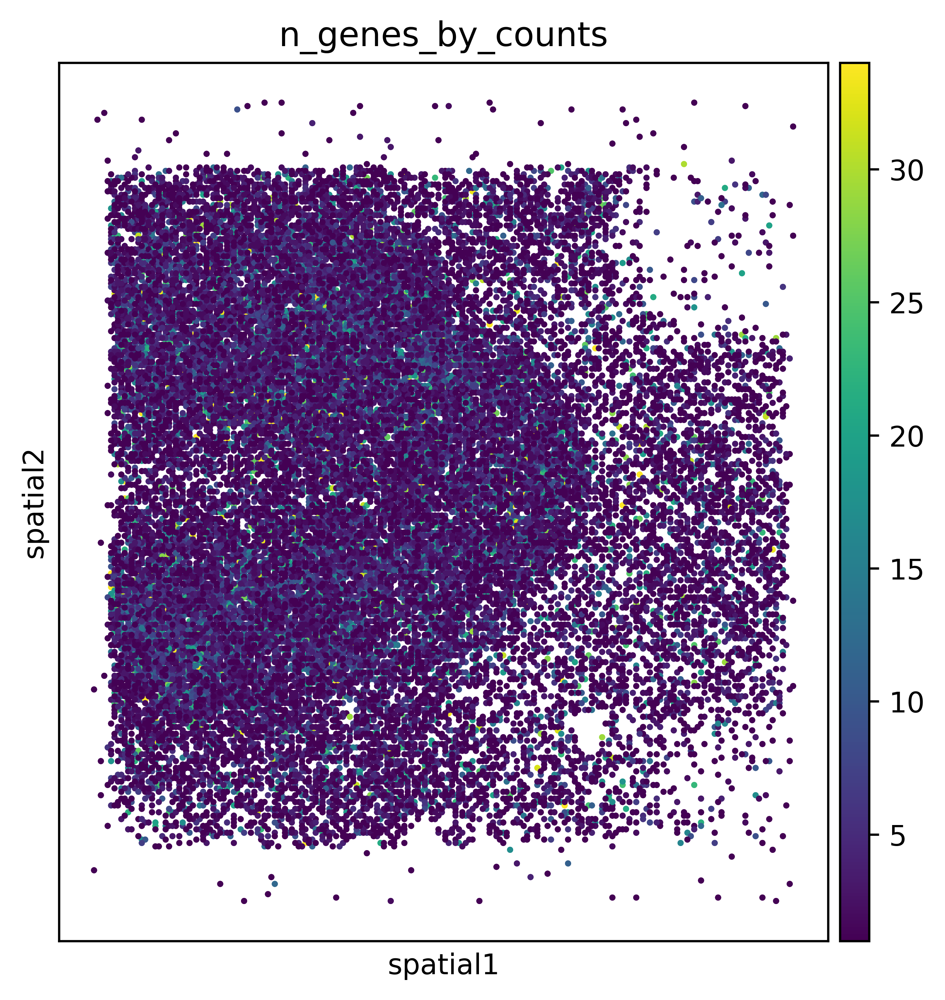

In [236]:
sc.pp.calculate_qc_metrics(sgdata,percent_top=None, log1p=False, inplace=True)
sq.pl.spatial_scatter(sgdata,shape=None,color=["n_genes_by_counts",],library_id='gRNA')

In [237]:
adata = ld.load_bin(gem_file="RNA/D03658A3.tissue.gem.bin_100",
                    bin_size=1,
                    library_id="expression")
adata

AnnData object with n_obs × n_vars = 25037 × 27367
    obsm: 'spatial'

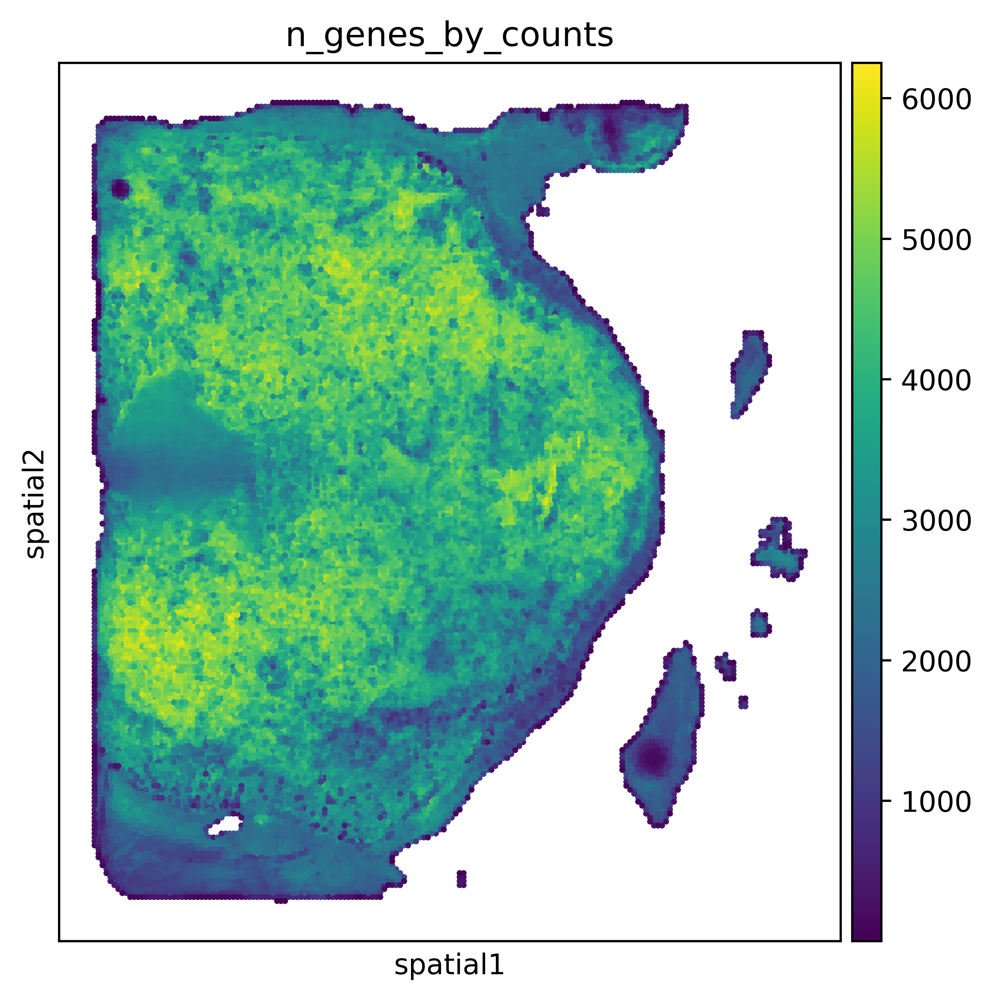

In [238]:
sc.pp.calculate_qc_metrics(adata,percent_top=None, log1p=False, inplace=True)
sq.pl.spatial_scatter(adata,shape=None,color=["n_genes_by_counts",],library_id='expression')

In [9]:
adata.var["mt"] = adata.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt"], inplace=True, log1p=True
)

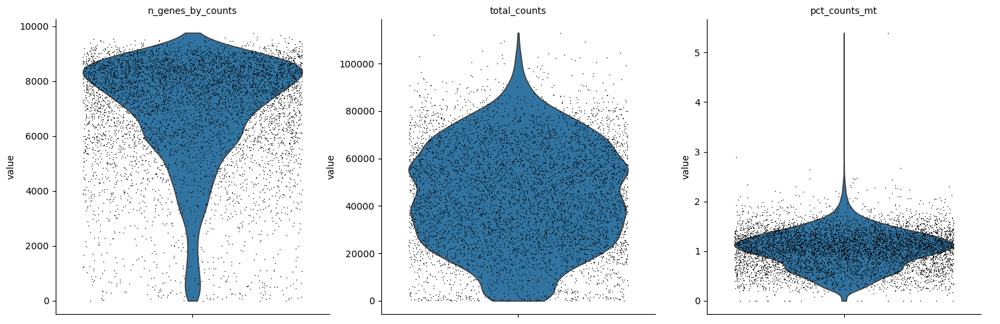

In [10]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True
)

In [239]:
tdata = adata.copy()

In [391]:
sq.gr.spatial_neighbors(tdata, coord_type="generic", spatial_key="spatial")
sq.gr.spatial_autocorr(tdata, mode="moran")
num_view = 12
tdata_top_autocorr = (
    tdata.uns["moranI"]["I"].sort_values(ascending=False).head(num_view).index.tolist()
)
tdata_bot_autocorr = (
    tdata.uns["moranI"]["I"].sort_values(ascending=True).head(num_view).index.tolist()
)
sq.pl.spatial_scatter(
    tdata, color=tdata_top_autocorr, size=20, cmap="Reds", img=False, figsize=(5, 5), shape=None, library_id="expression"
)

In [257]:
unset(range)

NameError: name 'unset' is not defined

In [251]:
for i in range(1, 10):
    print(i)

TypeError: 'numpy.float64' object is not callable

In [244]:
g_cells = [tuple(array) for array in sgdata.obsm['spatial']]
t_cells = [tuple(array) for array in tdata.obsm['spatial']]
cells_to_keep = [True if cell in t_cells else False for cell in g_cells]
cells_to_add = np.array([[cell[0], cell[1]] for cell in t_cells if cell not in g_cells])

#sgdata = gdata[~np.isin(gdata.obsm['spatial'], cells_to_remove), :].copy()
cgdata = sgdata[cells_to_keep, :].copy()
s = np.int8(len(cells_to_add))
new_data = np.zeros((len(cells_to_add), cgdata.n_vars))
new_obs = pd.DataFrame(index=[f'new_cell_{i}' for i in range(s)])
new_adata = ad.AnnData(new_data, var=cgdata.var.copy(), obs=new_obs)
new_adata.obsm['spatial'] = cells_to_add

cdata = cgdata.concatenate(new_adata, join='outer', index_unique=None)

sc.pp.calculate_qc_metrics(cdata,percent_top=None, log1p=False, inplace=True)
sq.pl.spatial_scatter(cdata,shape=None,color=["n_genes_by_counts",],library_id='gRNA')

/tmp/ipykernel_80817/3930583475.py:8: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 8856 to int8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  s = np.int8(len(cells_to_add))


TypeError: 'numpy.float64' object is not callable

In [14]:
sq.gr.spatial_neighbors(cdata, coord_type="generic", spatial_key="spatial")
sq.gr.spatial_autocorr(cdata, mode="moran")
num_view = 34
cdata_top_autocorr = (
    cdata.uns["moranI"]["I"].sort_values(ascending=False).head(num_view).index.tolist()
)
cdata_bot_autocorr = (
    cdata.uns["moranI"]["I"].sort_values(ascending=True).head(num_view).index.tolist()
)
cdata.uns["moranI"]

,I,pval_norm,var_norm,pval_norm_fdr_bh
sgKlrd1,0.053893,1.076916e-14,0.00005,3.661516e-13
sgGpa33,0.046544,2.030720e-11,0.00005,3.452224e-10
sgGata3,0.042657,7.137585e-10,0.00005,8.089263e-09
sgMark3,0.037951,3.579435e-08,0.00005,3.042520e-07
sgSorl1,0.036936,7.876617e-08,0.00005,5.356100e-07
sgGlb1l2,0.035629,2.109247e-07,0.00005,1.195240e-06
sgErgic2,0.034845,3.750071e-07,0.00005,1.821463e-06
sgIkbip,0.031799,3.129753e-06,0.00005,1.330145e-05
sgWipf1,0.031304,4.346006e-06,0.00005,1.641825e-05
sgZhx2,0.030930,5.551434e-06,0.00005,1.887487e-05


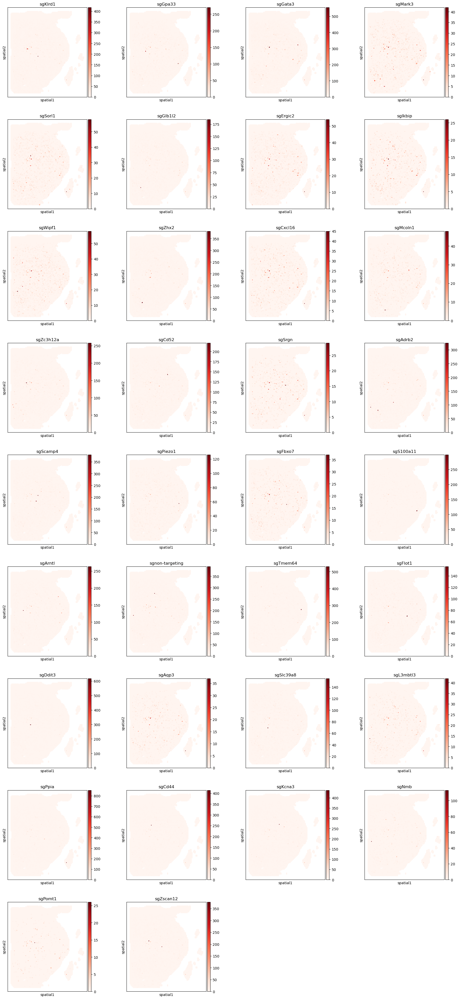

In [15]:
sq.pl.spatial_scatter(
    cdata, color=cdata_top_autocorr, size=20, cmap="Reds", img=False, figsize=(5, 5), shape=None, library_id="gRNA"
)

In [401]:
HA_annotation_file = open("./GO/HA.metabolism.txt", 'r')
HA_GO = np.array([])
for line in HA_annotation_file:
    HA_GO = np.append(HA_GO, line.split('\t')[2])
HA_GO = np.unique(HA_GO)

genes = np.array(tdata.var_names, dtype='<U32')
ha_mask = np.array([True if gene in HA_GO else False for gene in genes])

sc.tl.score_genes(tdata, gene_list=HA_GO, score_name="ha_score")

genes = cdata.var_names
ha_score_vec = np.array(tdata.obs['ha_score'])
gene_cor = {}
gene_p = {}
for gene in tqdm(genes):
    g_cnt_vec = np.array([var[0] for var in cdata[:,gene].X.toarray()])
    corr, p = pearsonr(ha_score_vec, g_cnt_vec)
    gene_cor[gene] = corr
    gene_p[gene] = p

gene_cor = pd.DataFrame.from_dict(gene_cor, orient='index', columns=['ha_corr'])
gene_p = pd.DataFrame.from_dict(gene_p, orient='index', columns=['ha_p'])

ha_auto_df = gene_p.join(cgdata.uns["moranI"])[["ha_p", "I"]]
ha_auto_df = gene_cor.join(ha_auto_df)

colors = ['blue' if p >= 0.05 else 'red' for p in ha_auto_df["ha_p"]]
plt.scatter(ha_auto_df['ha_corr'], ha_auto_df['I'], color=colors, label=labels)
for i, gene in enumerate(ha_auto_df.index):
    plt.annotate(gene.split('_')[0], (ha_auto_df['ha_corr'][i], ha_auto_df['I'][i]), fontsize=5)

plt.xlabel('gRNA count-HA metabolism correlation')
plt.ylabel('gRNA count auto correlation')
plt.show()

In [115]:
hallmark_file = open("./GO/mh.all.v2023.2.Mm.symbols.gmt", 'r')
data = []
for line in hallmark_file:
    parts = line.strip().split('\t')
    hallmark = parts[0]
    genes = parts[2:]

    for gene in genes:
        data.append([hallmark, gene])

hallmark_df = pd.DataFrame(data, columns=['Hallmark', 'Gene'])
hallmark_df['Hallmark'] = [mark.lstrip('HALLMARK')[1:].lower() for mark in hallmark_df['Hallmark']]
hallmarks = np.unique(hallmark_df['Hallmark'])
hallmarks

array(['adipogenesis', 'allograft_rejection', 'androgen_response',
       'angiogenesis', 'apical_junction', 'apical_surface', 'apoptosis',
       'bile_acid_metabolism', 'cholesterol_homeostasis', 'coagulation',
       'complement', 'dna_repair', 'e2f_targets',
       'epithelial_mesenchymal_transition', 'estrogen_response_early',
       'estrogen_response_late', 'fatty_acid_metabolism',
       'g2m_checkpoint', 'glycolysis', 'hedgehog_signaling',
       'heme_metabolism', 'hypoxia', 'il2_stat5_signaling',
       'il6_jak_stat3_signaling', 'inflammatory_response',
       'interferon_alpha_response', 'interferon_gamma_response',
       'kras_signaling_dn', 'kras_signaling_up', 'mitotic_spindle',
       'mtorc1_signaling', 'myc_targets_v1', 'myc_targets_v2',
       'myogenesis', 'notch_signaling', 'oxidative_phosphorylation',
       'p53_pathway', 'pancreas_beta_cells', 'peroxisome',
       'pi3k_akt_mtor_signaling', 'protein_secretion',
       'reactive_oxigen_species_pathway', 'sperma

In [117]:
hypoxia = hallmark_df.loc[hallmark_df['Hallmark'] == "hypoxia", 'Gene']
hypoxia

3135      Ackr3
3136        Adm
3137    Adora2b
3138        Ak4
3139     Akap12
         ...   
3329      Vldlr
3330       Wsb1
3331    Xpnpep1
3332     Zfp292
3333      Zfp36
Name: Gene, Length: 199, dtype: object

In [159]:
Tex = ['Havcr2', 'Lag3', 'Pdcd1', 'Entpd1', 'Tigit', 'Ctla4', 'Layn']
Macrophages = ["Ptprc", "Cd14", "Itgam", "Itgax", "Trem2", "Fcgr3a", "Fcgr3b", "Ccr2", "Cd163", "Cd68", "Arg1", "Adgre1", "Cd33", "Cd68", "C1qa", "Cd163",  "C1qb", "C1qc",  "Marco", "Cd81"]
DC = ["Ptprc", "Itgam", "Itgax", "Cd14", "Cd33", "Cd68", "Cd1c", "Cd209", "Ccl22", "Cd86", "Clec9a", "Clec10a", "Xcr1", "Lamp3"]
Endothelial = ["Vwf", "Pecam1", "Cldn5","Cdh5", "Mgp"]
Fibroblasts = ["Col1a1", "Col1a2", "Col3a1","Mmp2", "Myl9", "Dcn","Fap"]

In [193]:
tdata.obs['Fibroblasts_score']

140007201    4.038857
204010601    3.250286
8001001      4.045714
196010601    5.541714
196010801    4.152571
               ...   
4601        -0.008000
19001        0.000000
340023601    0.000000
5201         0.000000
240012001    0.000000
Name: Fibroblasts_score, Length: 6400, dtype: float64

                     ssim
sgAdrb2          0.399528
sgAqp3           0.639729
sgArntl          0.477596
sgCd44           0.514335
sgCd52           0.477221
sgCxcl16         0.580573
sgDdit3          0.435152
sgErgic2         0.557503
sgFbxo7          0.632271
sgFlot1          0.564958
sgGata3          0.240342
sgGlb1l2         0.535604
sgGpa33          0.413136
sgIkbip          0.636785
sgKcna3          0.458413
sgKlrd1          0.380595
sgL3mbtl3        0.643467
sgMark3          0.581695
sgMcoln1         0.616602
sgNmb            0.630217
sgPiezo1         0.572593
sgPomt1          0.686688
sgPpia           0.335093
sgS100a11        0.554322
sgScamp4         0.374071
sgSlc39a8        0.581404
sgSorl1          0.545634
sgSrgn           0.640706
sgTmem64         0.424049
sgWipf1          0.541677
sgZc3h12a        0.422985
sgZhx2           0.380152
sgZscan12        0.461311
sgnon-targeting  0.385687


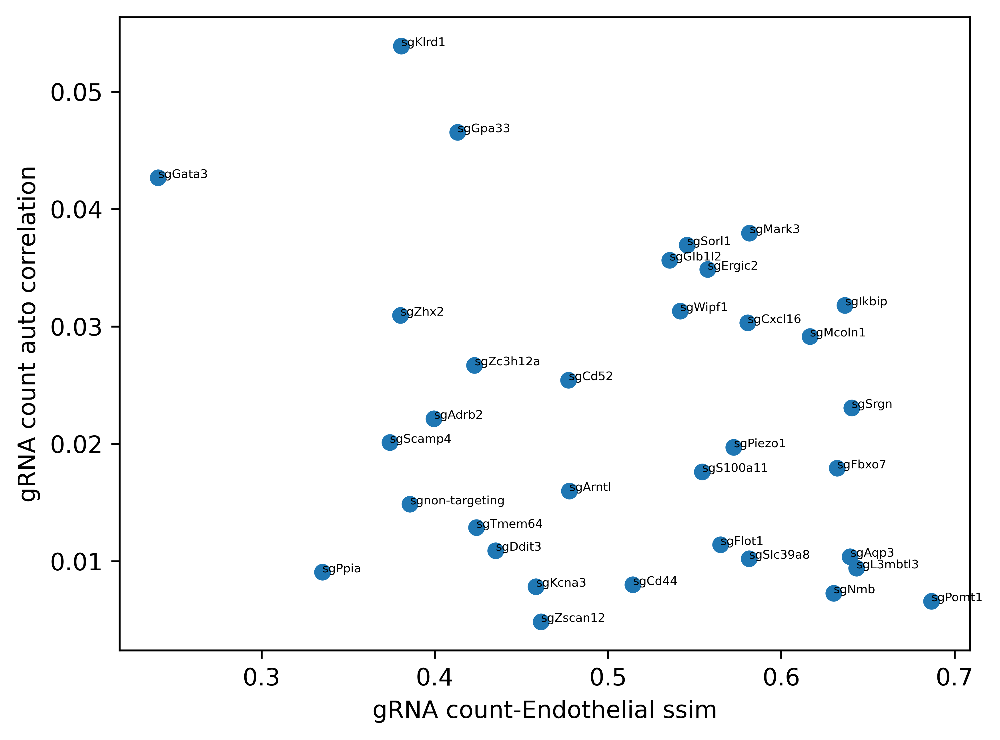

In [203]:
hallmark = "Endothelial"
genes = Endothelial
sgenes = cdata.var_names

sc.tl.score_genes(tdata, gene_list=genes, score_name=f"{hallmark}_score")
score_vec = np.array(tdata.obs[f"{hallmark}_score"])

ssim_dict = {}
ms_ssim_dict = {}

for sgene in sgenes:
    
    spatial_coords = tdata.obsm['spatial'] / 200
    max_x = int(np.max(spatial_coords[:, 0])) + 1
    max_y = int(np.max(spatial_coords[:, 1])) + 1
    score_matrix = np.zeros((max_x, max_y))
    for i, (x, y) in enumerate(spatial_coords):
        score_matrix[int(x), int(y)] = score_vec[i]
    score_tensor = torch.tensor(score_matrix).float().unsqueeze(0).unsqueeze(0)
    
    gene_expression_array = [cnt[0] for cnt in cdata[:,sgene].X.toarray()]
    guide_cnt_matrix = np.zeros((max_x, max_y))
    spatial_coords = cdata.obsm['spatial'] / 200
    for i, (x, y) in enumerate(spatial_coords):
        guide_cnt_matrix[int(x), int(y)] = gene_expression_array[i]
    guide_tensor = torch.tensor(guide_cnt_matrix).float().unsqueeze(0).unsqueeze(0)

    ssim_dict[sgene] = ssim(guide_tensor, score_tensor, data_range=255, size_average=False).numpy()[0]
    #ms_ssim_dict[sgene] = ms_ssim(guide_tensor, score_tensor, data_range=255, size_average=False)

gene_ssim = pd.DataFrame.from_dict(ssim_dict, orient='index', columns=['ssim'])
auto_df = gene_ssim.join(cdata.uns["moranI"])[["ssim", "I"]]
print(gene_ssim)

plt.scatter(auto_df['ssim'], auto_df['I'])
for i, gene in enumerate(auto_df.index):
    plt.annotate(gene.split('_')[0], (auto_df['ssim'][i], auto_df['I'][i]), fontsize=5)

plt.xlabel(f"gRNA count-{hallmark} ssim")
plt.ylabel('gRNA count auto correlation')
plt.show()

In [206]:
score_tensor.shape

torch.Size([1, 1, 90, 101])

In [207]:
guide_tensor.shape

torch.Size([1, 1, 90, 101])

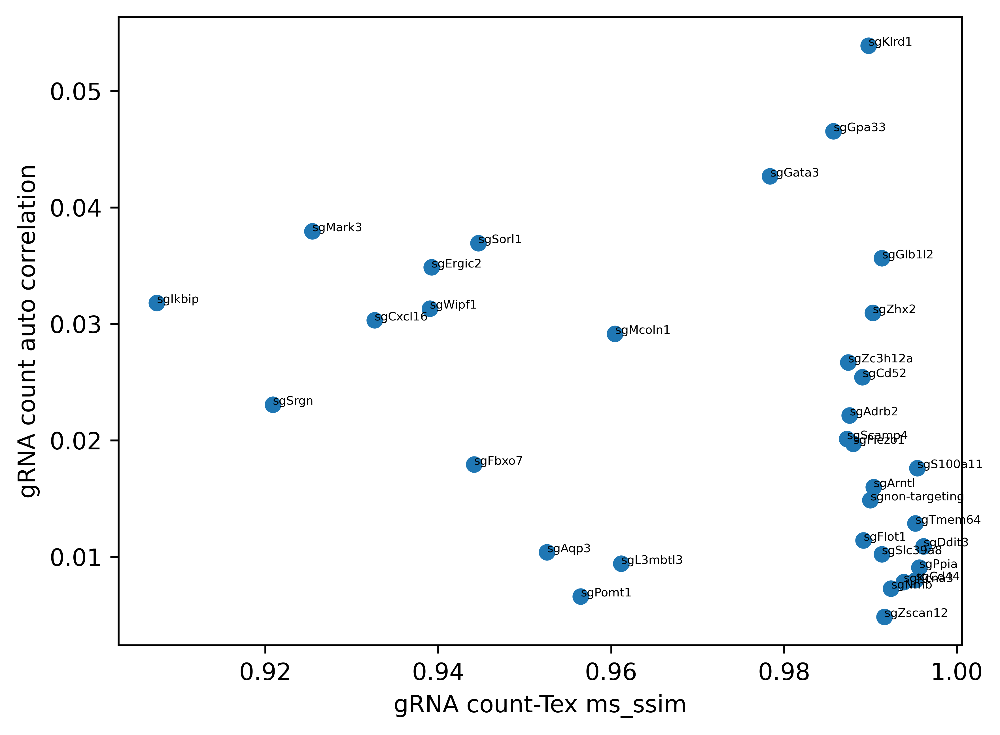

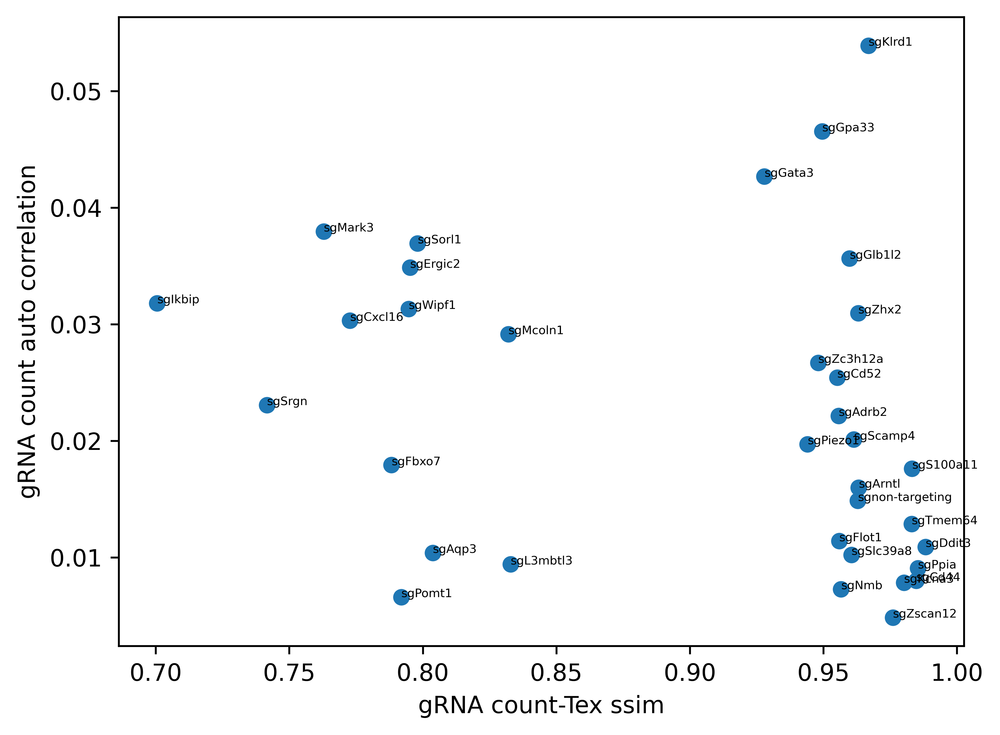

In [231]:
hallmark = "Tex"
genes = Tex
sgenes = cdata.var_names

sc.tl.score_genes(tdata, gene_list=genes, score_name=f"{hallmark}_score")
score_vec = np.array(tdata.obs[f"{hallmark}_score"])

ssim_dict = {}
ms_ssim_dict = {}

for sgene in sgenes:
    
    spatial_coords = tdata.obsm['spatial'] / 100
    max_x = int(np.max(spatial_coords[:, 0])) + 1
    max_y = int(np.max(spatial_coords[:, 1])) + 1
    score_matrix = np.zeros((max_x, max_y))
    for i, (x, y) in enumerate(spatial_coords):
        score_matrix[int(x), int(y)] = score_vec[i]
    score_tensor = torch.tensor(score_matrix).float().unsqueeze(0).unsqueeze(0)
    
    gene_expression_array = [cnt[0] for cnt in cdata[:,sgene].X.toarray()]
    guide_cnt_matrix = np.zeros((max_x, max_y))
    spatial_coords = cdata.obsm['spatial'] / 100
    for i, (x, y) in enumerate(spatial_coords):
        guide_cnt_matrix[int(x), int(y)] = gene_expression_array[i]
    guide_tensor = torch.tensor(guide_cnt_matrix).float().unsqueeze(0).unsqueeze(0)

    range = np.max([score_vec, gene_expression_array])

    ssim_dict[sgene] = ssim(guide_tensor, score_tensor, data_range=range, size_average=False).numpy()[0]
    ms_ssim_dict[sgene] = ms_ssim(guide_tensor, score_tensor, data_range=range, size_average=False)

gene_ssim = pd.DataFrame.from_dict(ssim_dict, orient='index', columns=['ssim'])
gene_ms_ssim = pd.DataFrame.from_dict(ms_ssim_dict, orient='index', columns=['ms_ssim'])
auto_df = gene_ssim.join(cdata.uns["moranI"])[["ssim", "I"]]
ms_auto_df = gene_ms_ssim.join(cdata.uns["moranI"])[["ms_ssim", "I"]]

plt.scatter(ms_auto_df['ms_ssim'], ms_auto_df['I'])
for i, gene in enumerate(ms_auto_df.index):
    plt.annotate(gene.split('_')[0], (ms_auto_df['ms_ssim'][i], ms_auto_df['I'][i]), fontsize=5)


plt.xlabel(f"gRNA count-{hallmark} ms_ssim")
plt.ylabel('gRNA count auto correlation')
plt.show()

plt.scatter(auto_df['ssim'], auto_df['I'])
for i, gene in enumerate(auto_df.index):
    plt.annotate(gene.split('_')[0], (auto_df['ssim'][i], auto_df['I'][i]), fontsize=5)

plt.xlabel(f"gRNA count-{hallmark} ssim")
plt.ylabel('gRNA count auto correlation')
plt.show()

  0%|          | 0/50 [00:00<?, ?it/s]

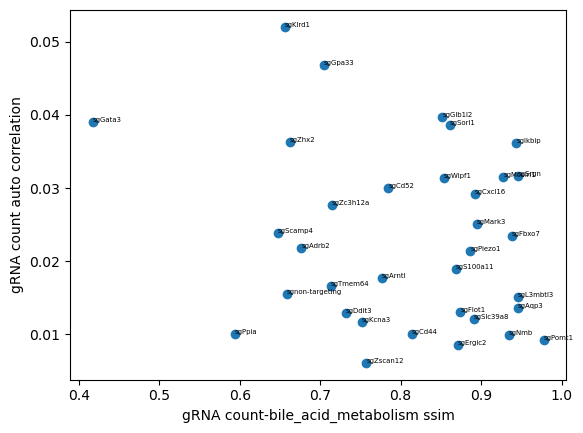

  2%|▏         | 1/50 [00:06<05:19,  6.51s/it]

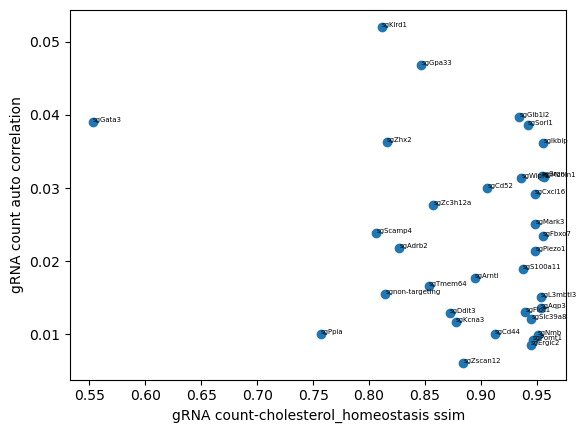

  4%|▍         | 2/50 [00:12<05:05,  6.37s/it]

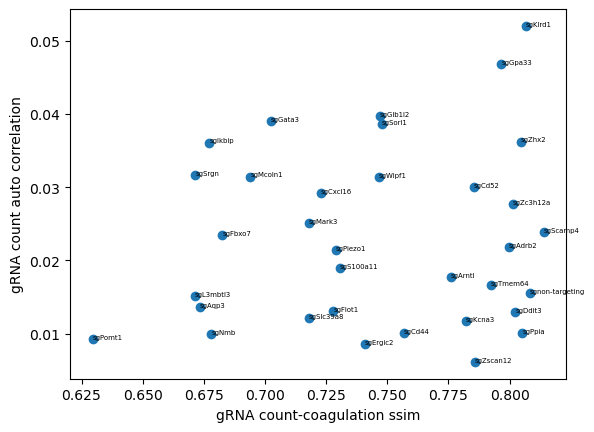

  6%|▌         | 3/50 [00:17<04:29,  5.73s/it]

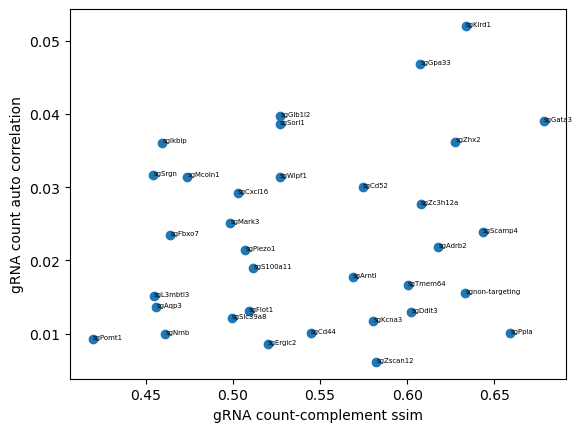

  8%|▊         | 4/50 [00:22<04:12,  5.50s/it]

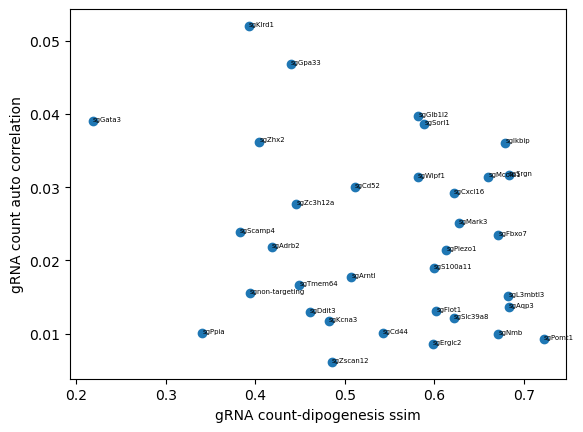

 10%|█         | 5/50 [00:26<03:44,  4.98s/it]

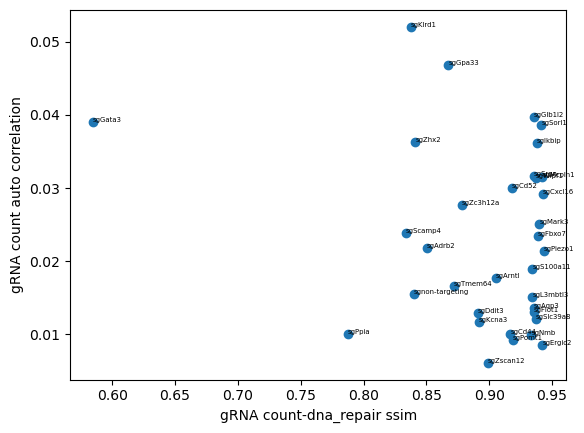

 12%|█▏        | 6/50 [00:31<03:30,  4.79s/it]

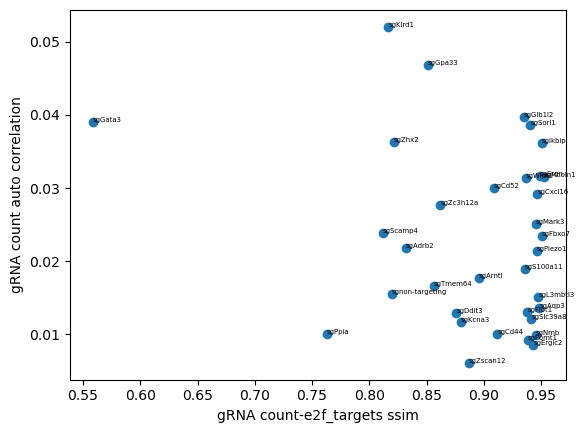

 14%|█▍        | 7/50 [00:36<03:25,  4.77s/it]

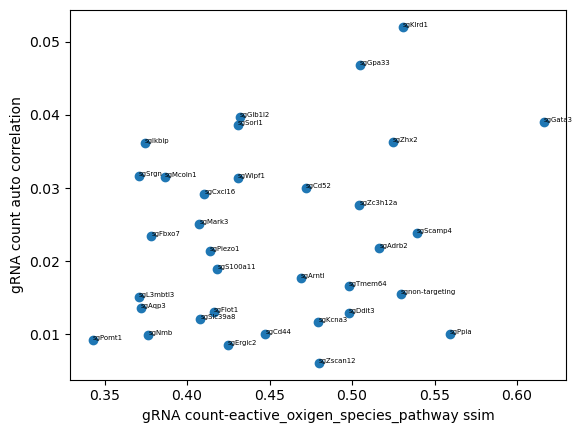

 16%|█▌        | 8/50 [00:40<03:20,  4.78s/it]

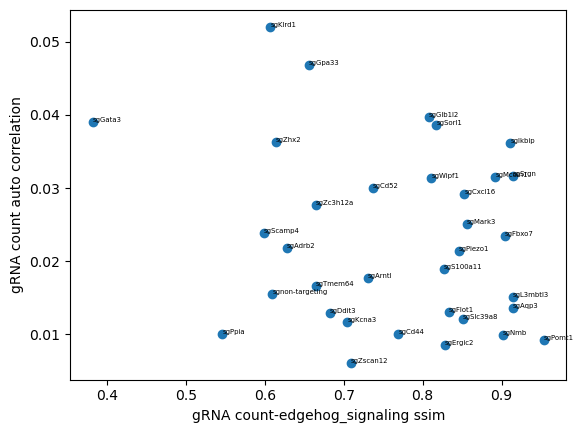

 18%|█▊        | 9/50 [00:44<03:06,  4.56s/it]

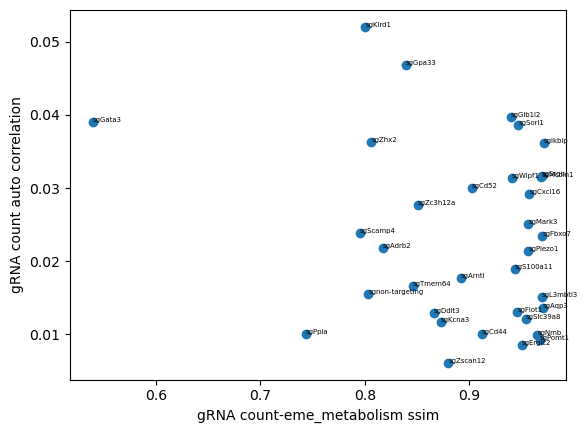

 20%|██        | 10/50 [00:50<03:13,  4.83s/it]

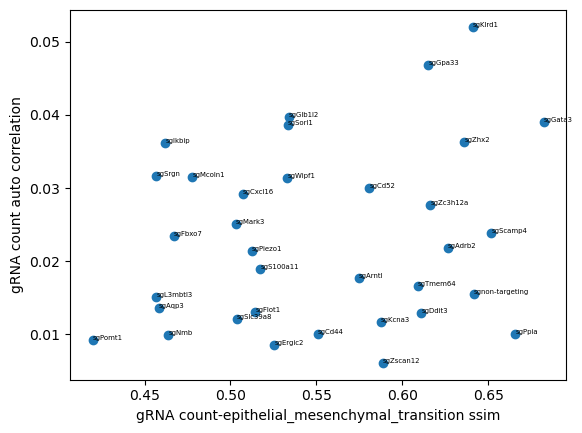

 22%|██▏       | 11/50 [00:55<03:16,  5.04s/it]

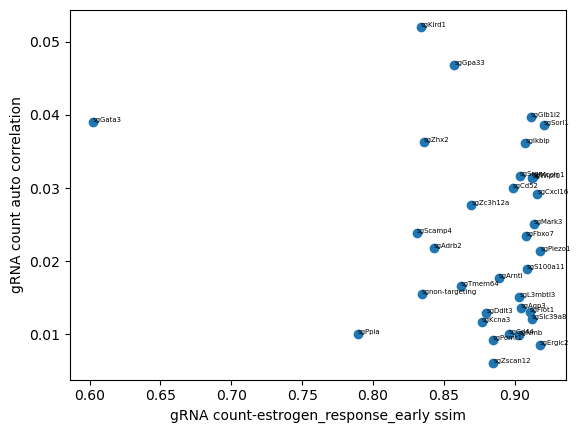

 24%|██▍       | 12/50 [01:00<03:08,  4.97s/it]

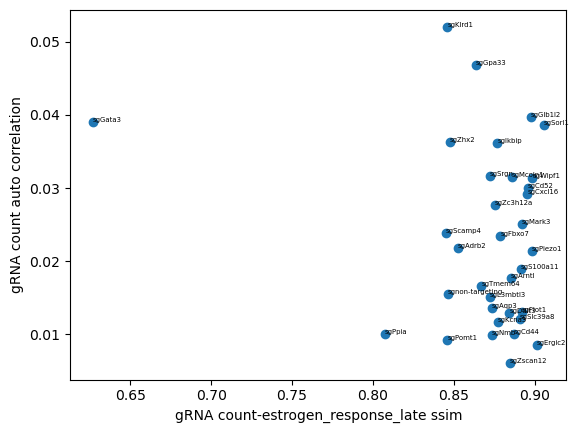

 26%|██▌       | 13/50 [01:05<02:57,  4.79s/it]

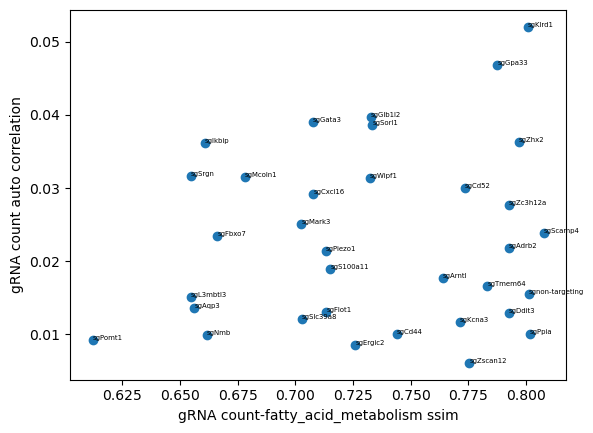

 28%|██▊       | 14/50 [01:09<02:42,  4.52s/it]

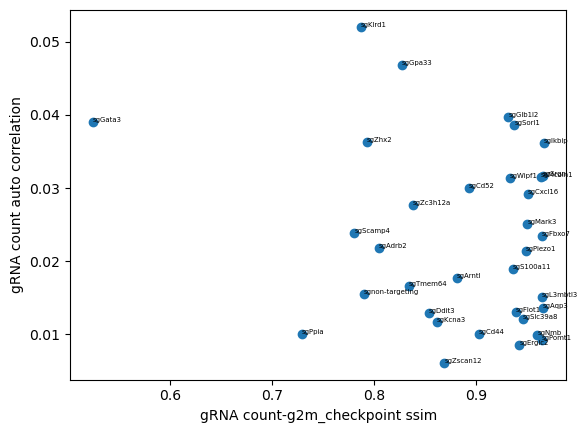

 30%|███       | 15/50 [01:14<02:49,  4.85s/it]

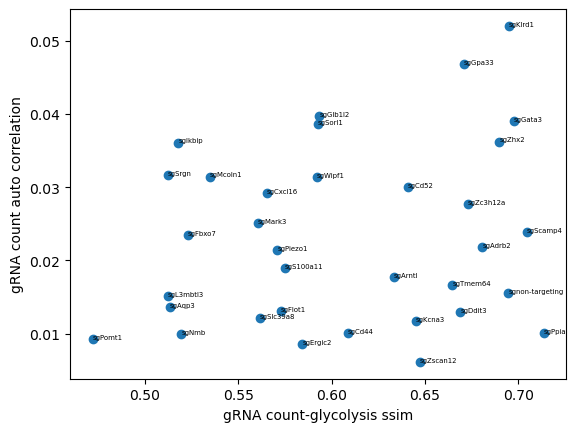

 32%|███▏      | 16/50 [01:18<02:32,  4.49s/it]

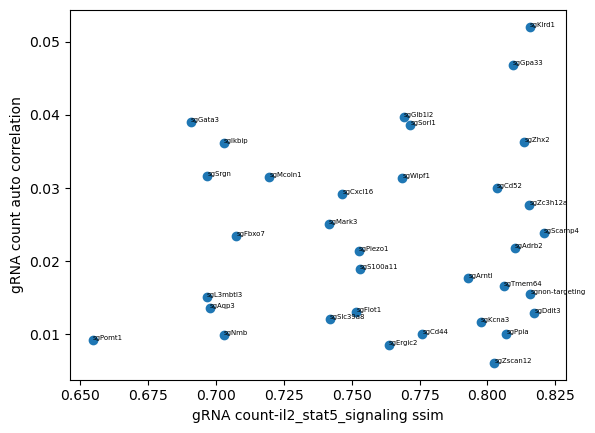

 34%|███▍      | 17/50 [01:23<02:31,  4.58s/it]

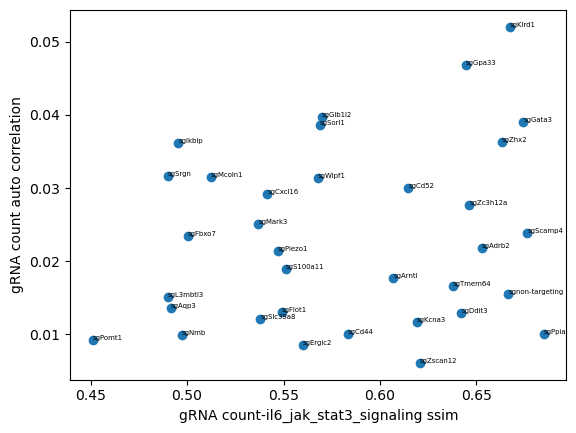

 36%|███▌      | 18/50 [01:27<02:28,  4.64s/it]

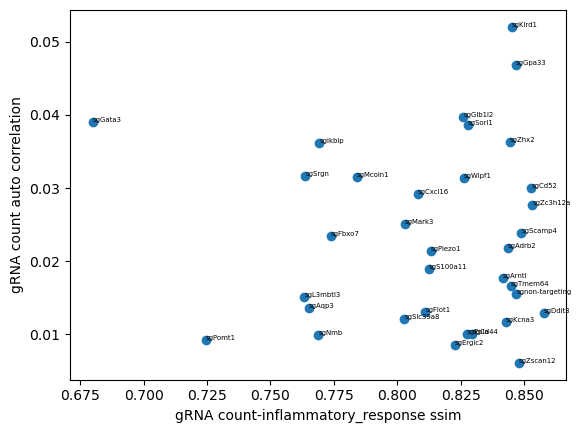

 38%|███▊      | 19/50 [01:32<02:21,  4.56s/it]

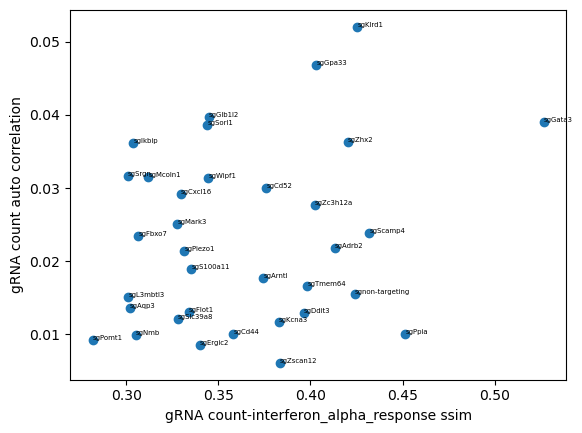

 40%|████      | 20/50 [01:35<02:08,  4.27s/it]

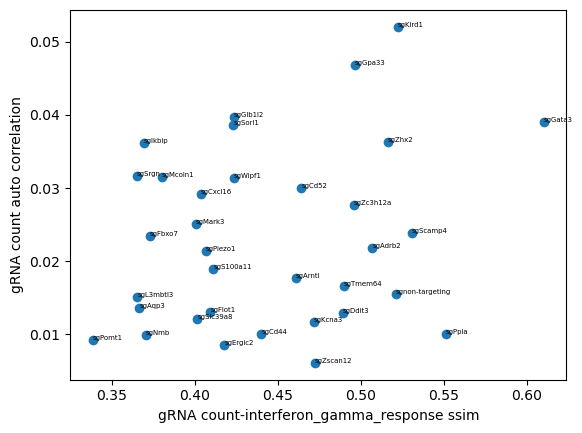

 42%|████▏     | 21/50 [01:40<02:08,  4.44s/it]

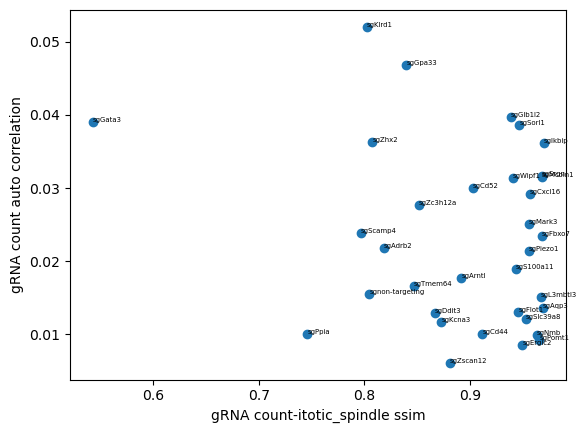

 44%|████▍     | 22/50 [01:45<02:09,  4.64s/it]

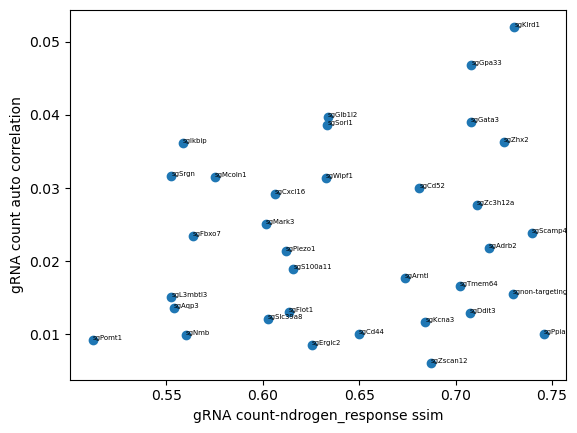

 46%|████▌     | 23/50 [01:50<02:03,  4.57s/it]

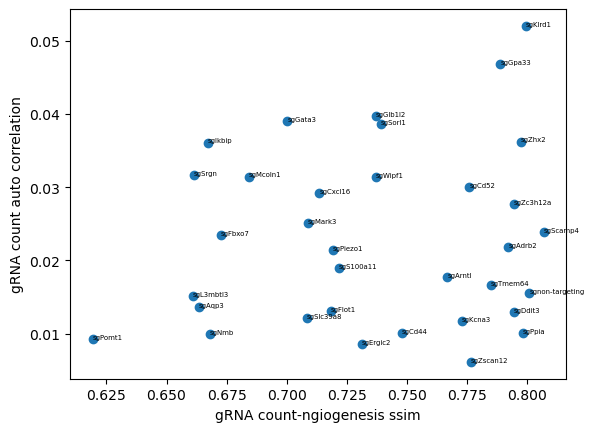

 48%|████▊     | 24/50 [01:55<02:02,  4.71s/it]

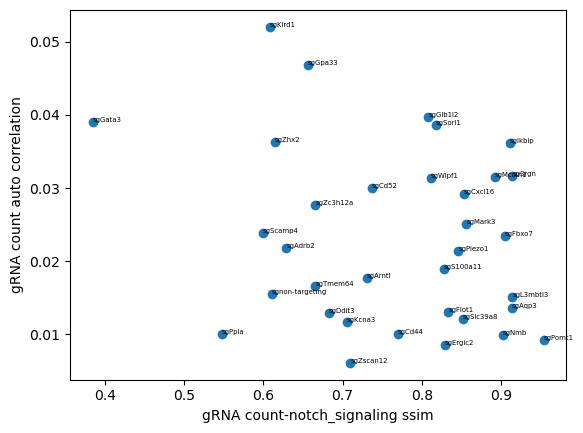

 50%|█████     | 25/50 [02:00<02:01,  4.84s/it]

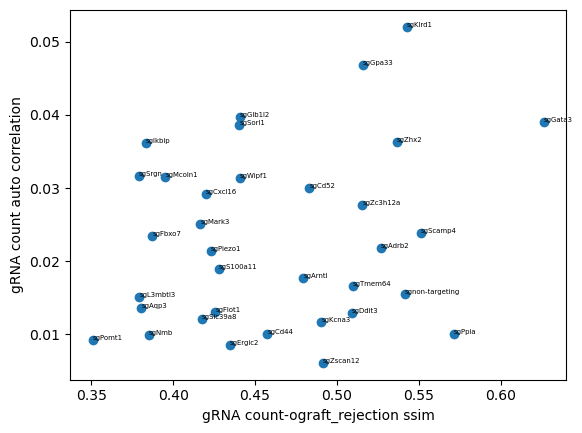

 52%|█████▏    | 26/50 [02:05<01:57,  4.91s/it]

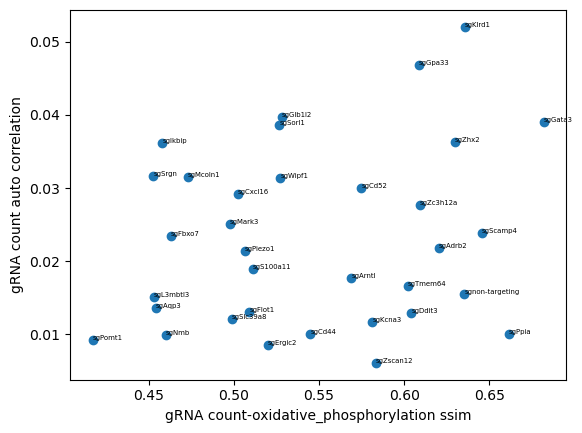

 54%|█████▍    | 27/50 [02:11<01:57,  5.13s/it]

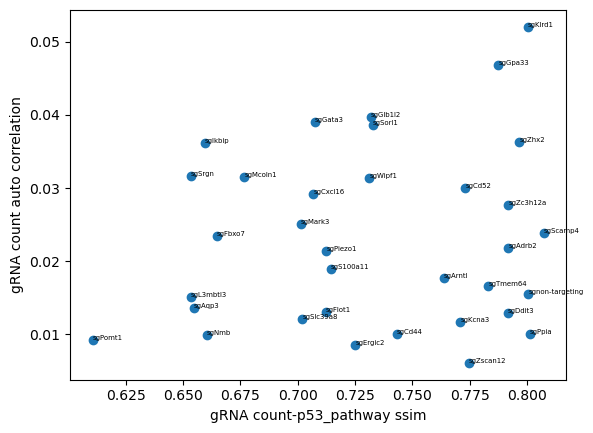

 56%|█████▌    | 28/50 [02:15<01:50,  5.00s/it]

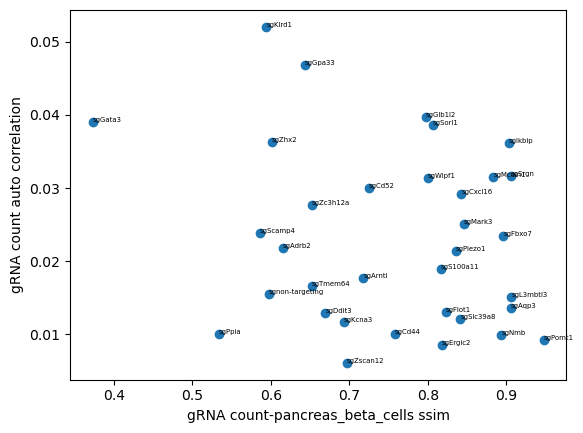

 58%|█████▊    | 29/50 [02:20<01:42,  4.87s/it]

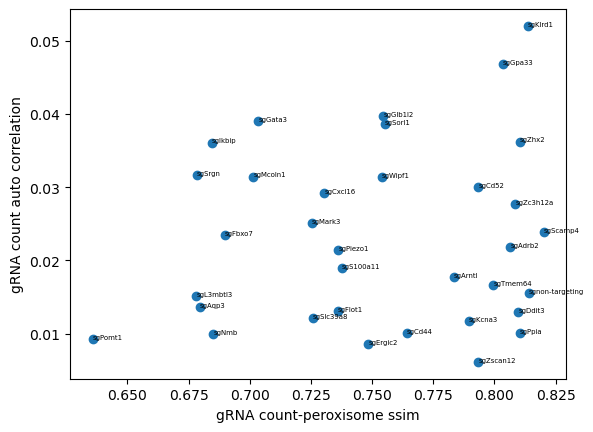

 60%|██████    | 30/50 [02:25<01:38,  4.90s/it]

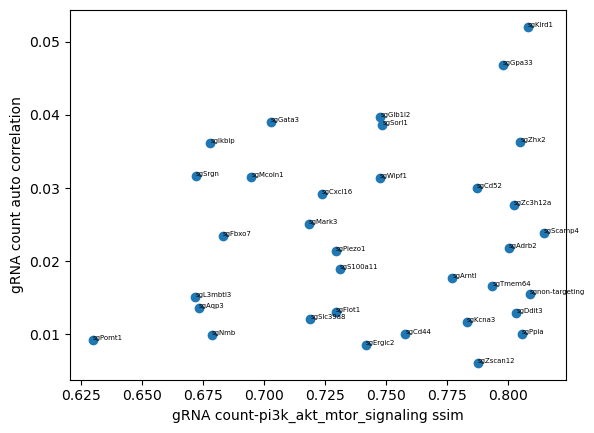

 62%|██████▏   | 31/50 [02:30<01:35,  5.00s/it]

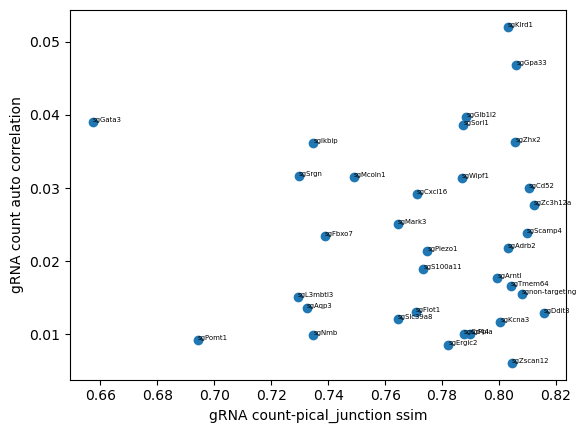

 64%|██████▍   | 32/50 [02:35<01:28,  4.89s/it]

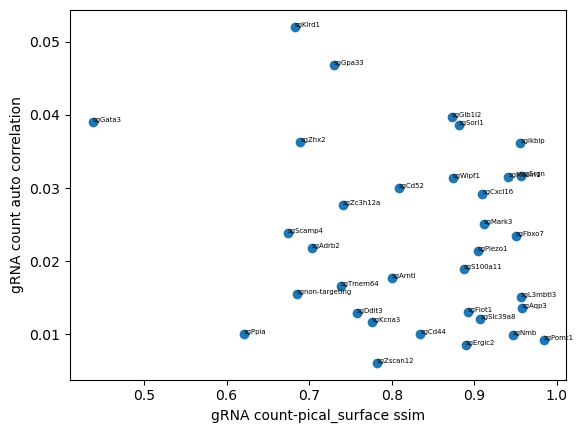

 66%|██████▌   | 33/50 [02:40<01:25,  5.04s/it]

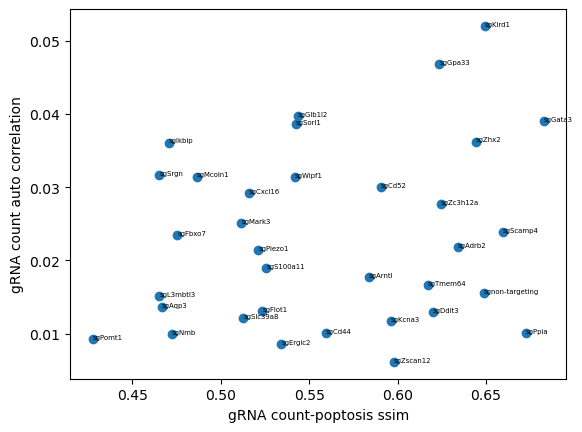

 68%|██████▊   | 34/50 [02:44<01:17,  4.85s/it]

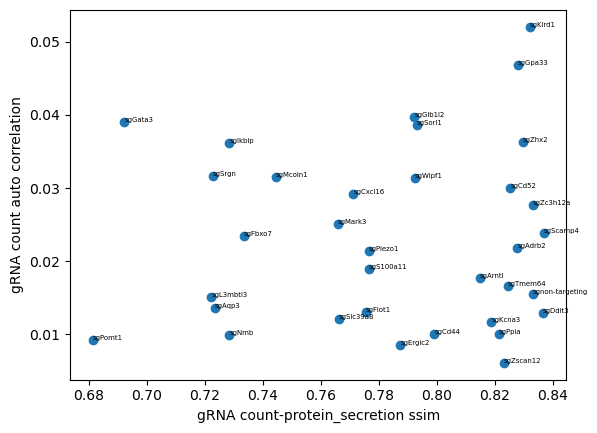

 70%|███████   | 35/50 [02:49<01:11,  4.74s/it]

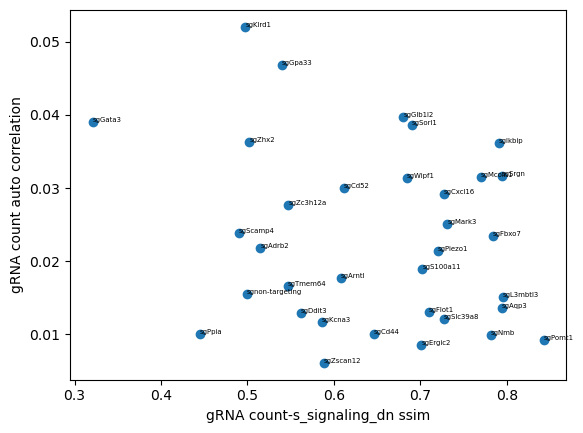

 72%|███████▏  | 36/50 [02:52<01:00,  4.31s/it]

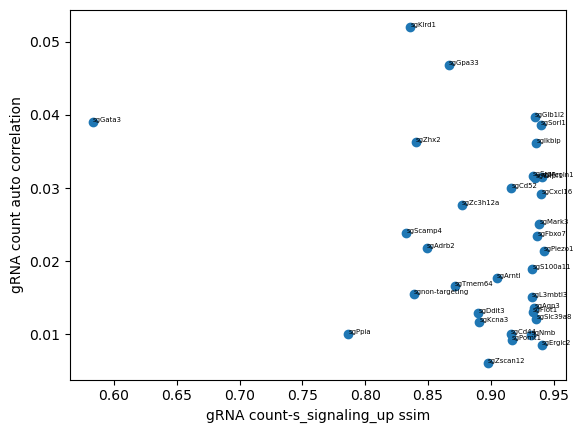

 74%|███████▍  | 37/50 [02:58<01:03,  4.89s/it]

       'Tnp1', 'Tssk2', 'Znrf4'],
      dtype='object')


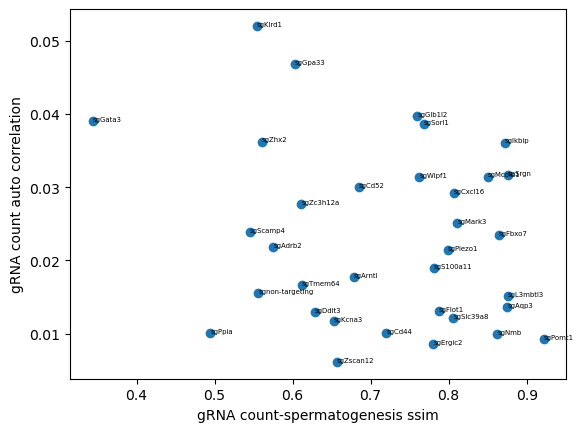

 76%|███████▌  | 38/50 [03:03<00:58,  4.89s/it]

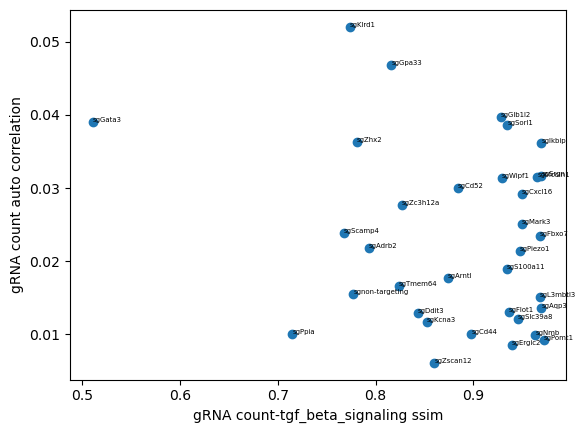

 78%|███████▊  | 39/50 [03:09<00:56,  5.13s/it]

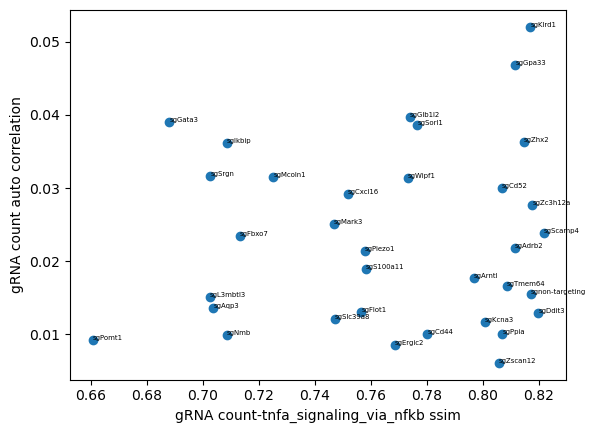

 80%|████████  | 40/50 [03:21<01:10,  7.08s/it]

       'Wars1'],
      dtype='object')


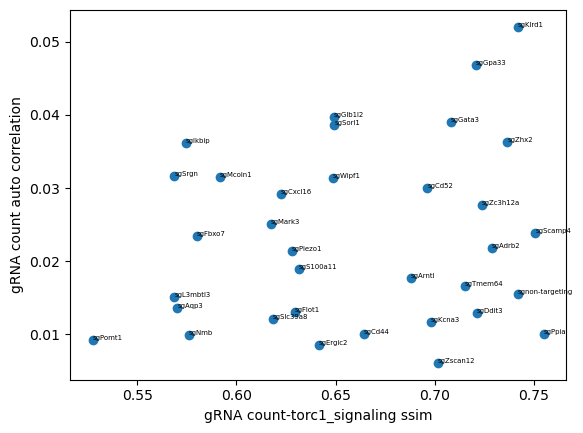

 82%|████████▏ | 41/50 [03:27<01:02,  6.97s/it]

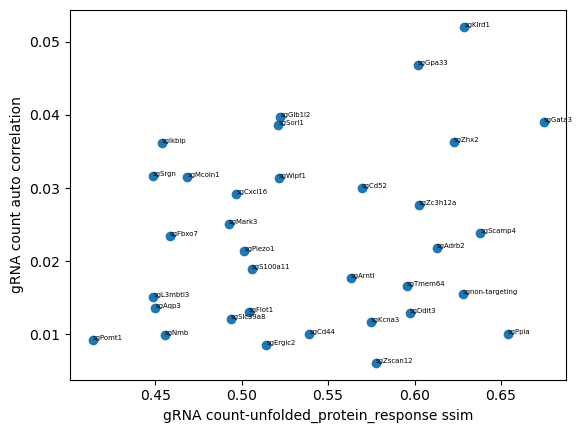

 84%|████████▍ | 42/50 [03:31<00:48,  6.08s/it]

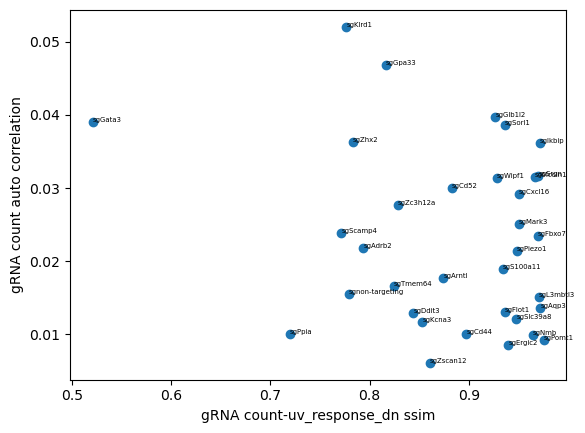

 86%|████████▌ | 43/50 [03:38<00:42,  6.09s/it]

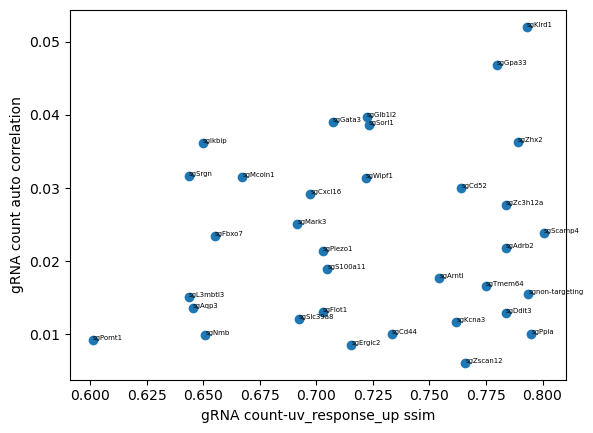

 88%|████████▊ | 44/50 [03:48<00:44,  7.37s/it]

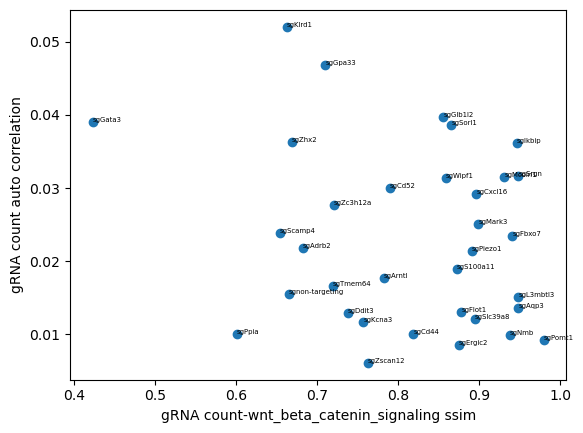

 90%|█████████ | 45/50 [03:55<00:36,  7.35s/it]

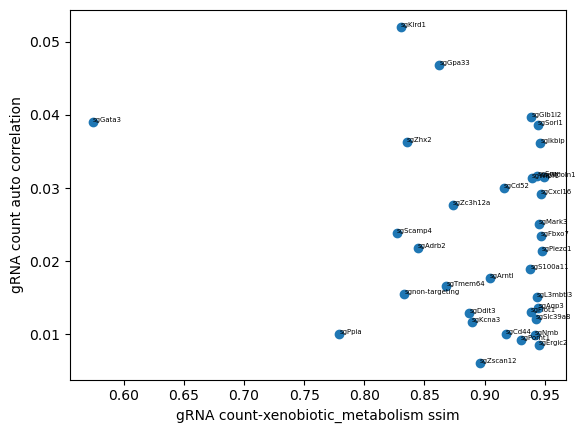

 92%|█████████▏| 46/50 [04:04<00:30,  7.70s/it]

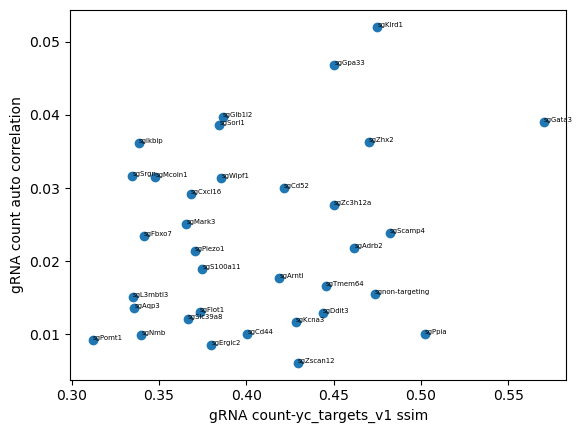

 94%|█████████▍| 47/50 [04:11<00:22,  7.44s/it]

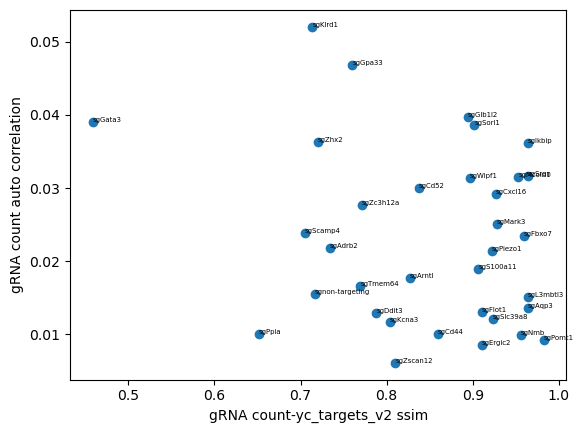

 96%|█████████▌| 48/50 [04:18<00:14,  7.48s/it]

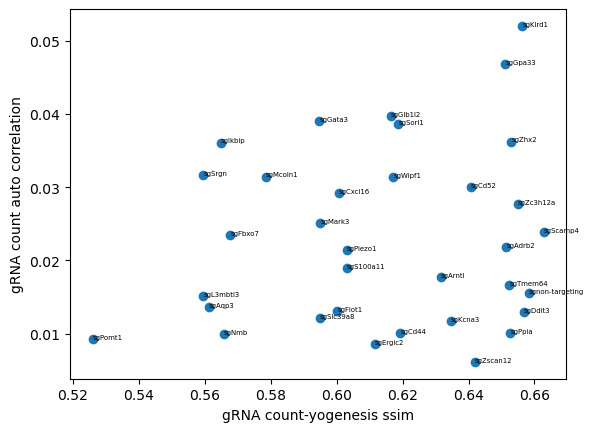

 98%|█████████▊| 49/50 [04:25<00:07,  7.22s/it]

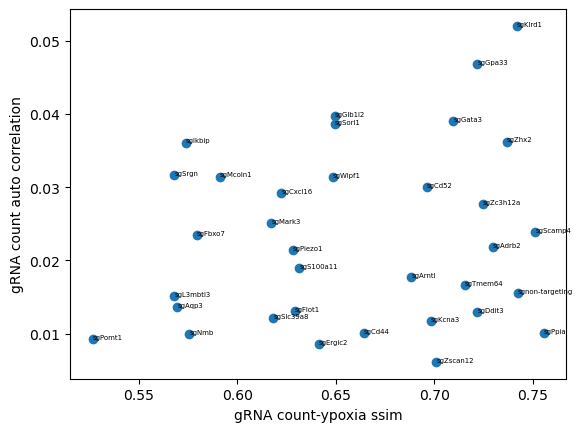

100%|██████████| 50/50 [04:31<00:00,  5.42s/it]


In [480]:
sgenes = cdata.var_names

for hallmark in tqdm(hallmarks):
    hallmark_genes = hallmark_df.loc[hallmark_df['Hallmark'] == hallmark, 'Gene']
    sc.tl.score_genes(tdata, gene_list=hallmark_genes, score_name="hallmark_score")
    score_vec = np.array(tdata.obs['hallmark_score'])

    ssim_dict = {}
    ms_ssim_dict = {}
    score_matrix = np.zeros((max_x, max_y))
    for i, (x, y) in enumerate(spatial_coords):
        score_matrix[int(x), int(y)] = score_vec[i]

    for sgene in sgenes:
        gene_expression_array = [cnt[0] for cnt in cdata[:,sgene].X.toarray()]
        spatial_coords = cdata.obsm['spatial'] / 200

        max_x = int(np.max(spatial_coords[:, 0])) + 1
        max_y = int(np.max(spatial_coords[:, 1])) + 1

        guide_cnt_matrix = np.zeros((max_x, max_y))
        for i, (x, y) in enumerate(spatial_coords):
            guide_cnt_matrix[int(x), int(y)] = gene_expression_array[i]

        guide_tensor = torch.tensor(guide_cnt_matrix).float().unsqueeze(0).unsqueeze(0)
        score_tensor = torch.tensor(score_matrix).float().unsqueeze(0).unsqueeze(0)

        ssim_dict[sgene] = ssim(guide_tensor, score_tensor, data_range=255, size_average=False).numpy()[0]
        #ms_ssim_dict[sgene] = ms_ssim(guide_tensor, score_tensor, data_range=255, size_average=False)

    gene_ssim = pd.DataFrame.from_dict(ssim_dict, orient='index', columns=['ssim'])

    ha_auto_df = gene_ssim.join(cgdata.uns["moranI"])[["ssim", "I"]]

    plt.scatter(ha_auto_df['ssim'], ha_auto_df['I'])
    for i, gene in enumerate(ha_auto_df.index):
        plt.annotate(gene.split('_')[0], (ha_auto_df['ssim'][i], ha_auto_df['I'][i]), fontsize=5)

    plt.xlabel(f"gRNA count-{hallmark} ssim")
    plt.ylabel('gRNA count auto correlation')
    plt.show()

100%|██████████| 34/34 [00:00<00:00, 387.94it/s]


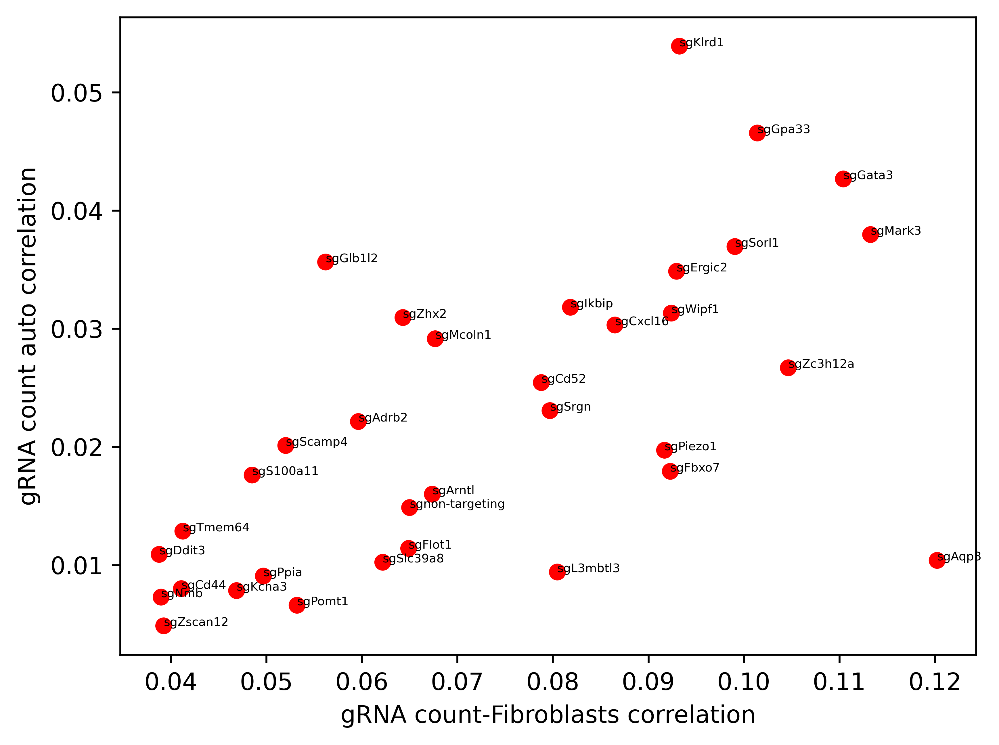

In [148]:
hallmark = "Fibroblasts"
sgenes = cdata.var_names
genes = Fibroblasts

sc.tl.score_genes(tdata, gene_list=genes, score_name=f"{hallmark}_score")

score_vec = np.array(tdata.obs[f"{hallmark}_score"])
gene_cor = {}
gene_p = {}
for gene in tqdm(sgenes):
    g_cnt_vec = np.array([var[0] for var in cdata[:,gene].X.toarray()])
    corr, p = pearsonr(score_vec, g_cnt_vec)
    gene_cor[gene] = corr
    gene_p[gene] = p

gene_cor = pd.DataFrame.from_dict(gene_cor, orient='index', columns=['corr'])
gene_p = pd.DataFrame.from_dict(gene_p, orient='index', columns=['p'])

auto_df = gene_p.join(cdata.uns["moranI"])[["p", "I"]]
auto_df = gene_cor.join(auto_df)

colors = ['blue' if p >= 0.05 else 'red' for p in auto_df["p"]]
plt.scatter(auto_df['corr'], auto_df['I'], color=colors)
for i, gene in enumerate(auto_df.index):
    plt.annotate(gene.split('_')[0], (auto_df['corr'][i], auto_df['I'][i]), fontsize=5)

plt.xlabel(f'gRNA count-{hallmark} correlation')
plt.ylabel('gRNA count auto correlation')
plt.show()

In [305]:
GO = {}
go_pathway_file = open("./GO/go-basic.obo", 'r')
for line in go_pathway_file:
    if line.startswith('id:'):
        go_id = line.rstrip('\n').lstrip('id: ')
    if line.startswith('name: '):
        go_name = line.rstrip('\n').lstrip('name: ')
        if (go_id.startswith('GO')): GO[go_id] = go_name

go_pathway = pd.DataFrame.from_dict(GO, orient='index', columns=['Name'])
print(len(go_pathway))

go_annotation = pd.read_csv("./GO/mgi.gaf", sep='\t', comment='!', header=None, usecols=[2,4])
go_annotation.columns = ["Gene", "GO"]
#go_annotation["Gene"] = [gene.split('/')[0] for gene in go_annotation["Gene"]]
#go_annotation = go_annotation.drop_duplicates()

47825


hyaluronan metabolic process


100%|██████████| 34/34 [00:00<00:00, 118.65it/s]


                        p
sgAdrb2          0.306884
sgAqp3           0.013094
sgArntl          0.022953
sgCd44           0.093204
sgCd52           0.074564
sgCxcl16         0.020254
sgDdit3          0.409121
sgErgic2         0.045936
sgFbxo7          0.002318
sgFlot1          0.467658
sgGata3          0.060958
sgGlb1l2         0.209154
sgGpa33          0.278838
sgIkbip          0.050084
sgKcna3          0.020116
sgKlrd1          0.062146
sgL3mbtl3        0.003878
sgMark3          0.199823
sgMcoln1         0.354874
sgNmb            0.658806
sgPiezo1         0.693289
sgPomt1          0.001527
sgPpia           0.025279
sgS100a11        0.002456
sgScamp4         0.191205
sgSlc39a8        0.049038
sgSorl1          0.085671
sgSrgn           0.000022
sgTmem64         0.012417
sgWipf1          0.209745
sgZc3h12a        0.022473
sgZhx2           0.018920
sgZscan12        0.012033
sgnon-targeting  0.518799


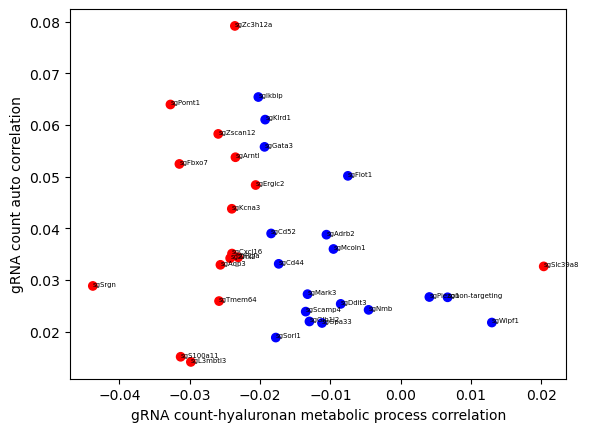

hyaluronan biosynthetic process


100%|██████████| 34/34 [00:00<00:00, 324.65it/s]


                            p
sgAdrb2          9.744751e-22
sgAqp3           8.726824e-10
sgArntl          4.007680e-19
sgCd44           2.591185e-18
sgCd52           1.022675e-09
sgCxcl16         1.222731e-10
sgDdit3          1.417676e-07
sgErgic2         2.030529e-11
sgFbxo7          3.752392e-16
sgFlot1          2.510175e-23
sgGata3          2.564779e-20
sgGlb1l2         4.252297e-13
sgGpa33          5.667038e-05
sgIkbip          3.387874e-20
sgKcna3          2.908321e-12
sgKlrd1          2.459909e-18
sgL3mbtl3        2.238680e-12
sgMark3          3.760193e-18
sgMcoln1         1.914142e-08
sgNmb            1.045668e-12
sgPiezo1         5.602287e-12
sgPomt1          5.360217e-17
sgPpia           1.819117e-17
sgS100a11        8.979183e-10
sgScamp4         9.052556e-08
sgSlc39a8        6.016194e-08
sgSorl1          7.773552e-10
sgSrgn           1.306330e-24
sgTmem64         1.979985e-11
sgWipf1          2.667211e-14
sgZc3h12a        3.558303e-26
sgZhx2           3.895744e-17
sgZscan12 

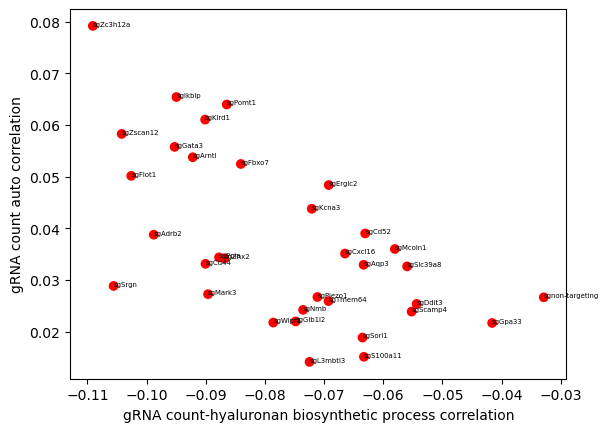

hyaluronan catabolic process


100%|██████████| 34/34 [00:00<00:00, 340.12it/s]


                        p
sgAdrb2          0.941025
sgAqp3           0.252162
sgArntl          0.918326
sgCd44           0.420496
sgCd52           0.988903
sgCxcl16         0.847129
sgDdit3          0.379426
sgErgic2         0.966962
sgFbxo7          0.556845
sgFlot1          0.040471
sgGata3          0.296842
sgGlb1l2         0.344852
sgGpa33          0.320386
sgIkbip          0.997560
sgKcna3          0.322890
sgKlrd1          0.255241
sgL3mbtl3        0.713666
sgMark3          0.366949
sgMcoln1         0.810478
sgNmb            0.612339
sgPiezo1         0.009740
sgPomt1          0.662570
sgPpia           0.232260
sgS100a11        0.087936
sgScamp4         0.633888
sgSlc39a8        0.878167
sgSorl1          0.331963
sgSrgn           0.030762
sgTmem64         0.729058
sgWipf1          0.005643
sgZc3h12a        0.068685
sgZhx2           0.384425
sgZscan12        0.106344
sgnon-targeting  0.232923


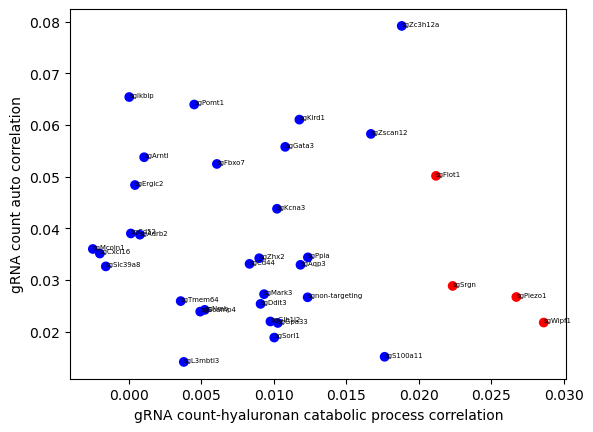

hyaluronan synthase activity


100%|██████████| 34/34 [00:00<00:00, 342.71it/s]


                        p
sgAdrb2          0.527669
sgAqp3           0.841908
sgArntl          0.388876
sgCd44           0.183123
sgCd52           0.994765
sgCxcl16         0.720794
sgDdit3          0.860407
sgErgic2         0.452424
sgFbxo7          0.529475
sgFlot1          0.120961
sgGata3          0.644219
sgGlb1l2         0.121776
sgGpa33          0.430384
sgIkbip          0.123441
sgKcna3          0.732906
sgKlrd1          0.717964
sgL3mbtl3        0.911158
sgMark3          0.847032
sgMcoln1         0.648563
sgNmb            0.936191
sgPiezo1         0.654673
sgPomt1          0.805786
sgPpia           0.720521
sgS100a11        0.317273
sgScamp4         0.899431
sgSlc39a8        0.000043
sgSorl1          0.814196
sgSrgn           0.485332
sgTmem64         0.056694
sgWipf1          0.232228
sgZc3h12a        0.310975
sgZhx2           0.539394
sgZscan12        0.388347
sgnon-targeting  0.299379


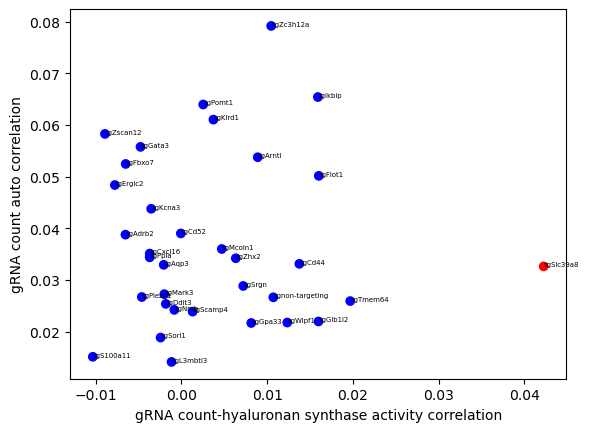

In [337]:
for pathway in go_pathway.index:
    go_name = go_pathway.loc[pathway, 'Name']
    if go_name.startswith("hyaluronan"): print(go_name)
    else: continue

    genes = np.array(go_annotation[go_annotation['GO'] == pathway]['Gene'])
    genes = [gene for gene in genes if gene in tdata.var_names]

    if not len(genes): continue

    sc.tl.score_genes(tdata, gene_list=genes, score_name=f"{pathway}_score")

    sgenes = cdata.var_names
    score_vec = np.array(tdata.obs[f"{pathway}_score"])
    gene_cor = {}
    gene_p = {}
    for gene in tqdm(sgenes):
        g_cnt_vec = np.array([var[0] for var in cdata[:,gene].X.toarray()])
        corr, p = pearsonr(score_vec, g_cnt_vec)
        gene_cor[gene] = corr
        gene_p[gene] = p

    gene_cor = pd.DataFrame.from_dict(gene_cor, orient='index', columns=['corr'])
    gene_p = pd.DataFrame.from_dict(gene_p, orient='index', columns=['p'])

    auto_df = gene_p.join(cgdata.uns["moranI"])[["p", "I"]]
    auto_df = gene_cor.join(auto_df)

    colors = ['blue' if p >= 0.05 else 'red' for p in auto_df["p"]]
    plt.scatter(auto_df['corr'], auto_df['I'], color=colors, label=labels)
    for i, gene in enumerate(auto_df.index):
        plt.annotate(gene.split('_')[0], (auto_df['corr'][i], auto_df['I'][i]), fontsize=5)

    plt.xlabel(f"gRNA count-{go_name} correlation")
    plt.ylabel('gRNA count auto correlation')
    plt.show()


In [350]:
pathway_corr = {}
pathway_p = {}
for pathway in tqdm(interest_pathway.index):
    go_name = go_pathway.loc[pathway, 'Name']
    if "metabolic" not in go_name: continue
    genes = np.array(go_annotation[go_annotation['GO'] == pathway]['Gene'])
    genes = [gene for gene in genes if gene in tdata.var_names]

    if not len(genes): continue

    sc.tl.score_genes(tdata, gene_list=genes, score_name=f"GO_score")

    score_vec = np.array(tdata.obs[f"GO_score"])
    g_cnt_vec = np.array([var[0] for var in cdata[:,"sgZc3h12a"].X.toarray()])
    corr, p = pearsonr(score_vec, g_cnt_vec)

    pathway_corr[pathway] = corr
    pathway_p[pathway] = p


  0%|          | 0/1810 [00:00<?, ?it/s]

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
100%|██████████| 1810/1810 [21:43<00:00,  1.39it/s] 


AttributeError: 'dict' object has no attribute 'join'

AttributeError: 'Annotation' object has no property 'angle'

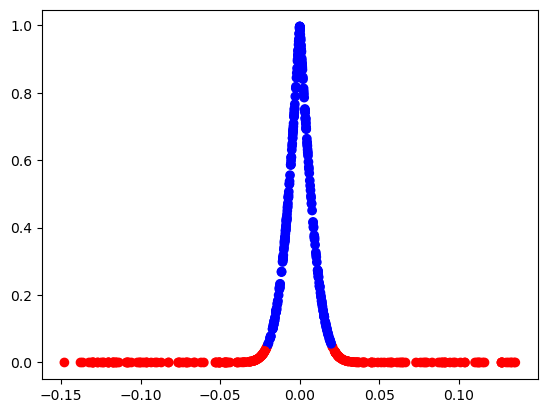

In [365]:

#pathway_cor = pd.DataFrame.from_dict(pathway_corr, orient='index', columns=['corr'])
#pathway_p = pd.DataFrame.from_dict(pathway_p, orient='index', columns=['p'])

auto_df = pathway_cor.join(pathway_p)

colors = ['blue' if p >= 0.05 else 'red' for p in auto_df["p"]]
plt.scatter(auto_df['corr'], auto_df['p'], color=colors, label=labels)
for i, pathway in enumerate(auto_df.index):
    if auto_df["corr"][i] > 0.1: plt.annotate(pathway, (auto_df['corr'][i], auto_df['p'][i]), fontsize=5, angle=45)

plt.xlabel("gRNA count-pathway correlation")
plt.ylabel('gRNA count-pathway correlation p')
plt.show()

In [136]:
cdata.var_names

Index(['sgAdrb2', 'sgAqp3', 'sgArntl', 'sgCd44', 'sgCd52', 'sgCxcl16',
       'sgDdit3', 'sgErgic2', 'sgFbxo7', 'sgFlot1', 'sgGata3', 'sgGlb1l2',
       'sgGpa33', 'sgIkbip', 'sgKcna3', 'sgKlrd1', 'sgL3mbtl3', 'sgMark3',
       'sgMcoln1', 'sgNmb', 'sgPiezo1', 'sgPomt1', 'sgPpia', 'sgS100a11',
       'sgScamp4', 'sgSlc39a8', 'sgSorl1', 'sgSrgn', 'sgTmem64', 'sgWipf1',
       'sgZc3h12a', 'sgZhx2', 'sgZscan12', 'sgnon-targeting'],
      dtype='object')

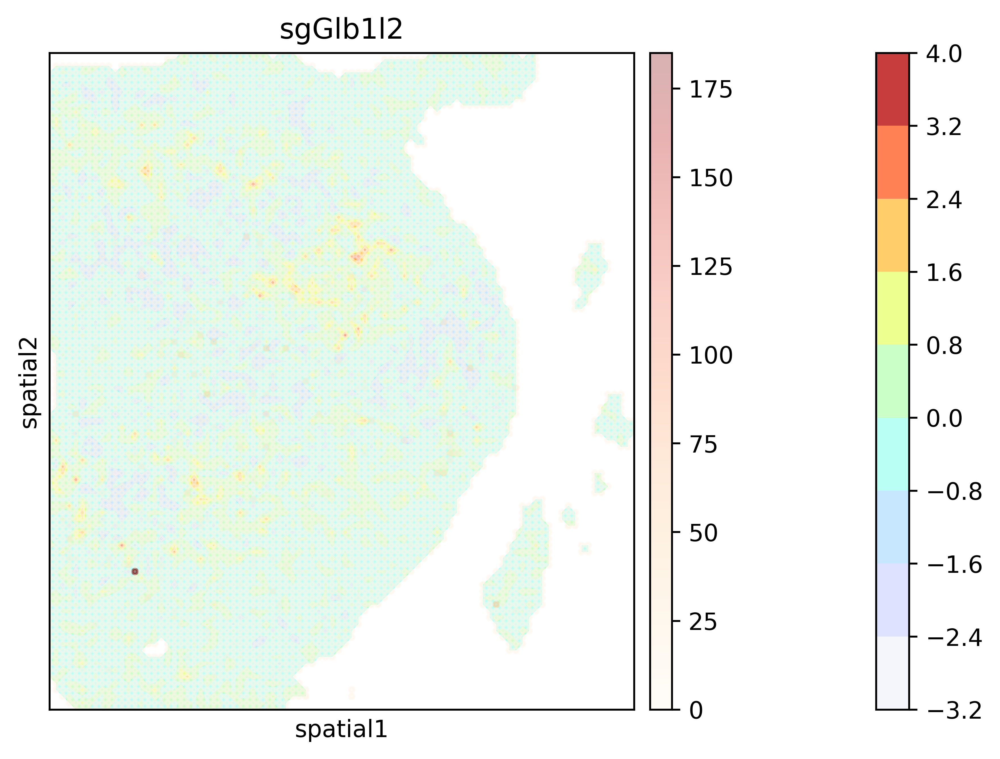

In [232]:
fig, axs = plt.subplots(1, 1, figsize=(15, 5))

interest_sgene = "sgGlb1l2"
interest_score = "Tex"

apo_bin = tdata.obs[f"{interest_score}_score"]

hypo_coord = tdata.obsm['spatial']
coord_df = pd.DataFrame({
    'x_coord': hypo_coord[:, 0],
    'y_coord': hypo_coord[:, 1],
    'value': apo_bin
})
coord_df_piv = pd.pivot_table(coord_df, values="value", index="y_coord", columns="x_coord", aggfunc=np.mean)

z = coord_df_piv.values
y = coord_df_piv.index
x = coord_df_piv.columns

cmap = plt.get_cmap("jet")

new_cmap = mcolors.ListedColormap(cmap(np.linspace(0, 1, 100)))
new_cmap.colors[:, -1] = np.linspace(0, 0.8, new_cmap.N) 

cs = axs.contourf(x, y, z, 8, cmap=new_cmap)
plt.colorbar(cs, ax=axs)

expression = cdata[:, interest_sgene].X.toarray().flatten()
sizes = (expression - np.min(expression)) / (np.max(expression) - np.min(expression)) * 100
sizes = np.array(sizes, dtype=np.float32)
sq.pl.spatial_scatter(cdata, shape=None, color=interest_sgene, cmap=mlt.colormaps['OrRd'], size_key=interest_sgene, library_id='expression', ax=axs, alpha=0.3)

plt.show()

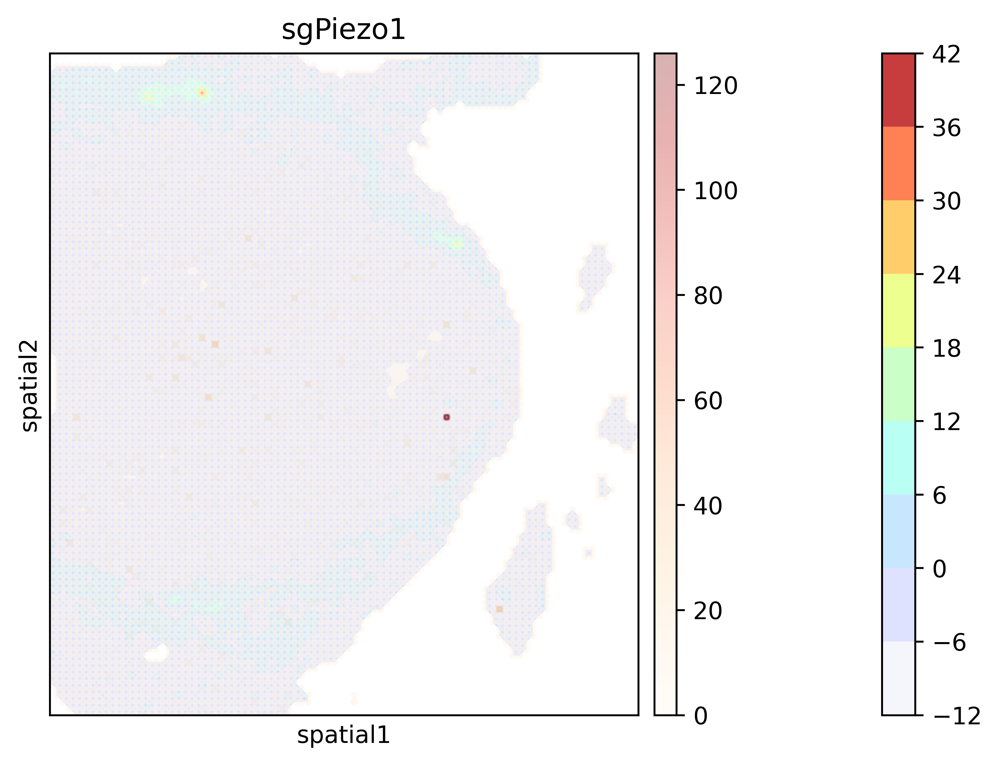

In [202]:
fig, axs = plt.subplots(1, 1, figsize=(15, 5))

interest_sgene = "sgPiezo1"
interest_score = "Endothelial"

apo_bin = tdata.obs[f"{interest_score}_score"]

hypo_coord = tdata.obsm['spatial']
coord_df = pd.DataFrame({
    'x_coord': hypo_coord[:, 0],
    'y_coord': hypo_coord[:, 1],
    'value': apo_bin
})
coord_df_piv = pd.pivot_table(coord_df, values="value", index="y_coord", columns="x_coord", aggfunc=np.mean)

z = coord_df_piv.values
y = coord_df_piv.index
x = coord_df_piv.columns

cmap = plt.get_cmap("jet")

new_cmap = mcolors.ListedColormap(cmap(np.linspace(0, 1, 100)))
new_cmap.colors[:, -1] = np.linspace(0, 0.8, new_cmap.N) 

cs = axs.contourf(x, y, z, 8, cmap=new_cmap)
plt.colorbar(cs, ax=axs)

expression = cdata[:, interest_sgene].X.toarray().flatten()
sizes = (expression - np.min(expression)) / (np.max(expression) - np.min(expression)) * 100
sizes = np.array(sizes, dtype=np.float32)
sq.pl.spatial_scatter(cdata, shape=None, color=interest_sgene, cmap=mlt.colormaps['OrRd'], size_key=interest_sgene, library_id='expression', ax=axs, alpha=0.3)

plt.show()

In [527]:
np.max(cdata[:,"sgGata3"].X.flatten())

array(554.)

In [528]:
import seaborn as sns

/tmp/ipykernel_38229/4224741431.py:1: RuntimeWarning: divide by zero encountered in log10
  sns.histplot(np.log10(cdata[:,"sgGata3"].X.toarray().flatten()), kde=False)


<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

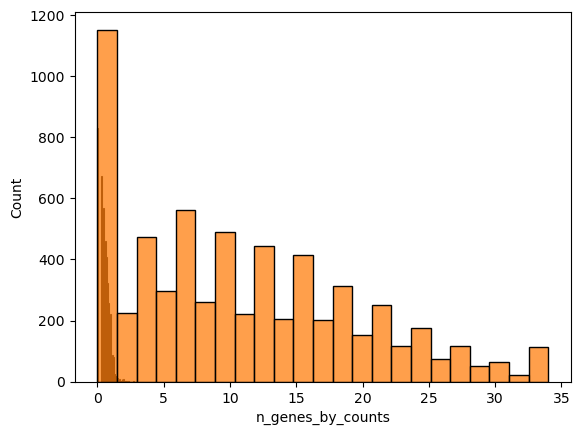

In [539]:
sns.histplot(np.log10(cdata[:,"sgGata3"].X.toarray().flatten()), kde=False)
sns.histplot(cdata.obs["n_genes_by_counts"], kde=False)